# **Data pre-processing**

In [ ]:
#import necessary libraries
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

In [ ]:

# URL of the dataset from UCI repository
url = 'https://archive.ics.uci.edu/ml/machine-learning-databases/00485/google_review_ratings.csv'

# Load the dataset
data = pd.read_csv(url)

# Display the first few rows of the dataset
print(data.head())

     User  Category 1  Category 2  Category 3  Category 4  Category 5  \
0  User 1         0.0         0.0        3.63        3.65         5.0   
1  User 2         0.0         0.0        3.63        3.65         5.0   
2  User 3         0.0         0.0        3.63        3.63         5.0   
3  User 4         0.0         0.5        3.63        3.63         5.0   
4  User 5         0.0         0.0        3.63        3.63         5.0   

   Category 6  Category 7  Category 8  Category 9  ...  Category 16  \
0        2.92         5.0        2.35        2.33  ...         0.59   
1        2.92         5.0        2.64        2.33  ...         0.59   
2        2.92         5.0        2.64        2.33  ...         0.59   
3        2.92         5.0        2.35        2.33  ...         0.59   
4        2.92         5.0        2.64        2.33  ...         0.59   

  Category 17  Category 18  Category 19  Category 20  Category 21  \
0         0.5          0.0          0.5          0.0          0.0

**Identify missing values**

In [ ]:
# Check for missing values in each column
missing_values = data.isnull().sum()    #calculates the number of missing values for each column
print("Missing values in each column:\n", missing_values)

# Display total number of missing values in the entire dataset
total_missing = missing_values.sum()
print(f"Total number of missing values: {total_missing}")


Missing values in each column:
 User              0
Category 1        0
Category 2        0
Category 3        0
Category 4        0
Category 5        0
Category 6        0
Category 7        0
Category 8        0
Category 9        0
Category 10       0
Category 11       0
Category 12       1
Category 13       0
Category 14       0
Category 15       0
Category 16       0
Category 17       0
Category 18       0
Category 19       0
Category 20       0
Category 21       0
Category 22       0
Category 23       0
Category 24       1
Unnamed: 25    5454
dtype: int64
Total number of missing values: 5456


According to the above output,

Columns with a Small Number of Missing Values:

*   Category 12(Burger/Pizza Shops) and Category 24(Gardens) each have 1 missing value.
*   Since these columns only have one missing value each, you can decide to either:
Fill the missing value with the column mean or median, which would maintain the size of your dataset without significantly affecting the data.


Unnamed: 25 Column:

The "Unnamed: 25" column has 5454 missing values out of 5456 rows. This suggests that the column is likely irrelevant or an artifact of the data. It’s best to drop this column entirely.

**Handling Missing Values**

In [ ]:
# Drop the 'Unnamed: 25' column since it only contains missing values
data.drop(columns=['Unnamed: 25'], inplace=True)

# Fill the missing values in 'Category 12(Burger/Pizza Shops) ' and 'Category 24(Gardens)' with the mean of each column
data['Category 12'].fillna(data['Category 12'].mean(), inplace=True)
data['Category 24'].fillna(data['Category 24'].mean(), inplace=True)

# Verify that there are no more missing values
print("Missing values after handling:\n", data.isnull().sum())

Missing values after handling:
 User           0
Category 1     0
Category 2     0
Category 3     0
Category 4     0
Category 5     0
Category 6     0
Category 7     0
Category 8     0
Category 9     0
Category 10    0
Category 11    0
Category 12    0
Category 13    0
Category 14    0
Category 15    0
Category 16    0
Category 17    0
Category 18    0
Category 19    0
Category 20    0
Category 21    0
Category 22    0
Category 23    0
Category 24    0
dtype: int64


<ipython-input-75-d34d6df0f1b4>:5: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  data['Category 12'].fillna(data['Category 12'].mean(), inplace=True)
<ipython-input-75-d34d6df0f1b4>:6: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inpl

**Normalizing the Rating Features**

In [ ]:

from sklearn.preprocessing import MinMaxScaler

data.iloc[:, 1:] = data.iloc[:, 1:].replace(r'\s+', '', regex=True)  # Remove all whitespaces
data.iloc[:, 1:] = data.iloc[:, 1:].replace(r'[^\d.]', '', regex=True)  # Keep only digits and dots

#Convert all columns from 1 onwards to numeric, replacing non-numeric values with NaN
data.iloc[:, 1:] = data.iloc[:, 1:].apply(pd.to_numeric, errors='coerce')

# Check for any remaining NaN values and fill them with the mean of the column
data.iloc[:, 1:] = data.iloc[:, 1:].fillna(data.iloc[:, 1:].mean())

# Create a Min-Max scaler object
scaler = MinMaxScaler()

# Fit and transform the data (excluding user ID column)
data_scaled = scaler.fit_transform(data.iloc[:, 1:])

# Create a new DataFrame with scaled data
scaled_df = pd.DataFrame(data_scaled, columns=data.columns[1:])

# Display the first few rows of the scaled data
print(scaled_df.head())


   Category 1  Category 2  Category 3  Category 4  Category 5  Category 6  \
0         0.0         0.0       0.726    0.676259         1.0    0.465296   
1         0.0         0.0       0.726    0.676259         1.0    0.465296   
2         0.0         0.0       0.726    0.671463         1.0    0.465296   
3         0.0         0.1       0.726    0.671463         1.0    0.465296   
4         0.0         0.0       0.726    0.671463         1.0    0.465296   

   Category 7  Category 8  Category 9  Category 10  ...  Category 15  \
0         1.0    0.359903    0.358173     0.436754  ...        0.348   
1         1.0    0.429952    0.358173     0.439141  ...        0.348   
2         1.0    0.429952    0.358173     0.436754  ...        0.348   
3         1.0    0.359903    0.358173     0.436754  ...        0.348   
4         1.0    0.429952    0.358173     0.436754  ...        0.348   

   Category 16  Category 17  Category 18  Category 19  Category 20  \
0        0.118          0.1       

<ipython-input-76-4eddeb9c3cf4>:12: FutureWarning: Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  data.iloc[:, 1:] = data.iloc[:, 1:].fillna(data.iloc[:, 1:].mean())


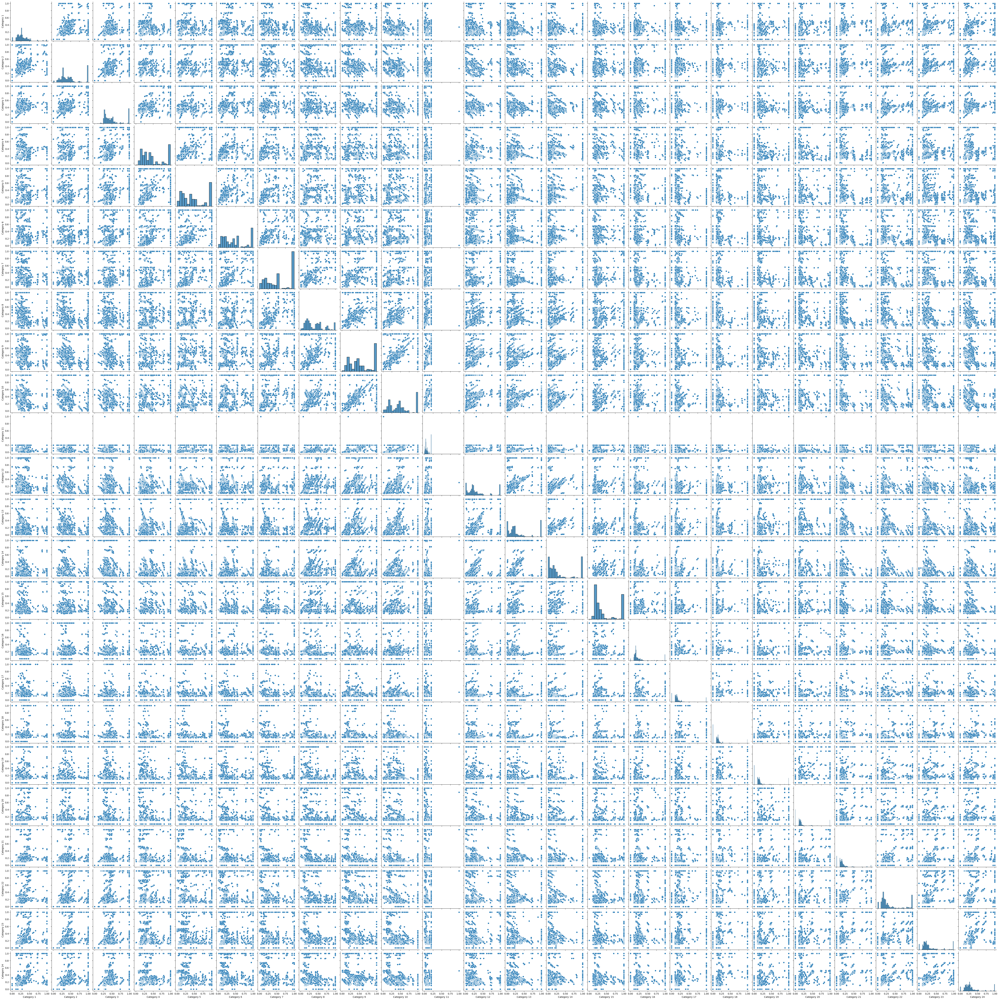

In [ ]:
# Pairwise Scatterplots
sns.pairplot(scaled_df)
plt.show()

**Outlier Detection and Handling**

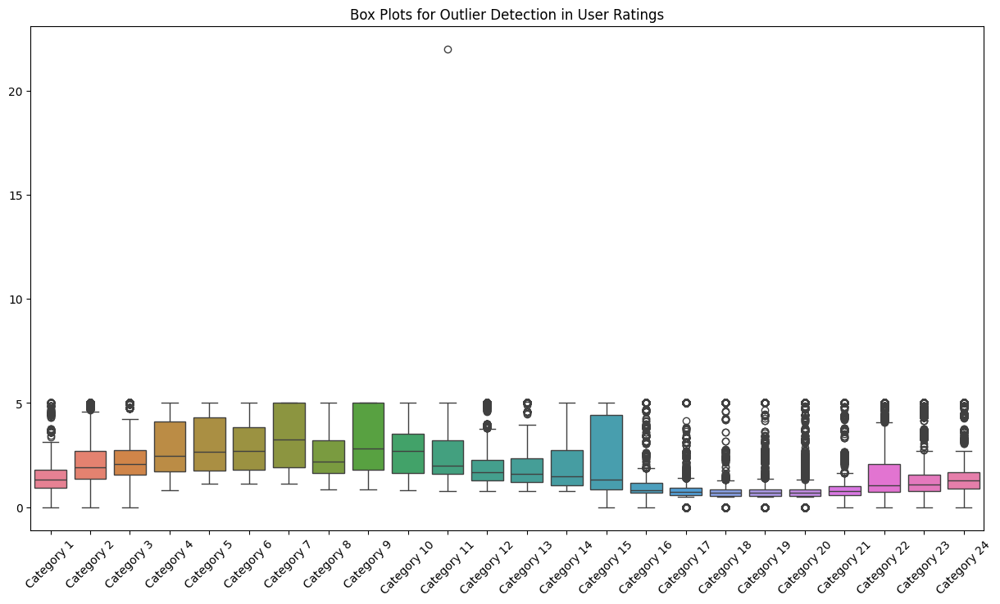

In [ ]:


# Box Plots for outlier detection
plt.figure(figsize=(15, 8))
sns.boxplot(data=data)
plt.xticks(rotation=45)
plt.title('Box Plots for Outlier Detection in User Ratings')
plt.show()



In [ ]:
#Function for find outlier columns
def find_outlier_columns(df):
  outlier_columns = []
  for column in df.columns[1:]:  # Iterate through all rating columns
    Q1 = df[column].quantile(0.25)
    Q3 = df[column].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    if len(df[(df[column] < lower_bound) | (df[column] > upper_bound)]) > 0:
      outlier_columns.append(column)
  return outlier_columns

# Identify columns with outliers
outlier_cols = find_outlier_columns(data)
print("Columns with outliers:", outlier_cols)

Columns with outliers: ['Category 1', 'Category 2', 'Category 3', 'Category 11', 'Category 12', 'Category 13', 'Category 16', 'Category 17', 'Category 18', 'Category 19', 'Category 20', 'Category 21', 'Category 22', 'Category 23', 'Category 24']


In [ ]:
#Function for removing outliers
def remove_outliers_iqr(df, columns):
    #Removes outliers from specified DataFrame columns using the IQR method
    filtered_df = df.copy()

    for column in columns:
        Q1 = filtered_df[column].quantile(0.25)
        Q3 = filtered_df[column].quantile(0.75)
        IQR = Q3 - Q1
        lower_bound = Q1 - 1.5 * IQR
        upper_bound = Q3 + 1.5 * IQR

        # Filter out outliers for the current column
        filtered_df = filtered_df[(filtered_df[column] >= lower_bound) & (filtered_df[column] <= upper_bound)]

    return filtered_df

 # Remove outliers from all identified columns
data_no_outliers = remove_outliers_iqr(data, outlier_cols)

In [ ]:
#Function for checking ouliers
def check_outliers(df, columns):
    #Checks for outliers in specified DataFrame columns using the IQR method
    outlier_counts = {}

    for column in columns:
        Q1 = df[column].quantile(0.25)
        Q3 = df[column].quantile(0.75)
        IQR = Q3 - Q1
        lower_bound = Q1 - 1.5 * IQR
        upper_bound = Q3 + 1.5 * IQR

        # Count the number of outliers
        outlier_count = df[(df[column] < lower_bound) | (df[column] > upper_bound)].shape[0]
        outlier_counts[column] = outlier_count

    return outlier_counts


# Check for remaining outliers
outliers_after_removal = check_outliers(data_no_outliers, outlier_cols)

# Display results
for column, count in outliers_after_removal.items():
    print(f"{column}: {count} outliers remaining")


Category 1: 11 outliers remaining
Category 2: 19 outliers remaining
Category 3: 14 outliers remaining
Category 11: 152 outliers remaining
Category 12: 33 outliers remaining
Category 13: 94 outliers remaining
Category 16: 56 outliers remaining
Category 17: 70 outliers remaining
Category 18: 95 outliers remaining
Category 19: 62 outliers remaining
Category 20: 36 outliers remaining
Category 21: 0 outliers remaining
Category 22: 4 outliers remaining
Category 23: 1 outliers remaining
Category 24: 0 outliers remaining


In [ ]:
def iterative_remove_outliers_iqr(df, columns, max_iterations=10):
    filtered_df = df.copy()

    for _ in range(max_iterations):
        # Track if any outliers were removed
        outliers_found = False

        for column in columns:
            Q1 = filtered_df[column].quantile(0.25)
            Q3 = filtered_df[column].quantile(0.75)
            IQR = Q3 - Q1
            lower_bound = Q1 - 1.5 * IQR
            upper_bound = Q3 + 1.5 * IQR

            # Filter out outliers for the current column
            new_filtered_df = filtered_df[(filtered_df[column] >= lower_bound) & (filtered_df[column] <= upper_bound)]

            # Check if any rows were removed
            if new_filtered_df.shape[0] < filtered_df.shape[0]:
                outliers_found = True

            filtered_df = new_filtered_df

        # If no outliers were found in this iteration, break out of the loop
        if not outliers_found:
            break

    return filtered_df

# Identify columns with outliers
outlier_cols = find_outlier_columns(data)
print("Columns with outliers:", outlier_cols)

# Remove outliers from all identified columns iteratively
data_no_outliers = iterative_remove_outliers_iqr(data, outlier_cols)

# Check for remaining outliers
outliers_after_removal = check_outliers(data_no_outliers, outlier_cols)

# Display results
for column, count in outliers_after_removal.items():
    print(f"{column}: {count} outliers remaining")


Columns with outliers: ['Category 1', 'Category 2', 'Category 3', 'Category 11', 'Category 12', 'Category 13', 'Category 16', 'Category 17', 'Category 18', 'Category 19', 'Category 20', 'Category 21', 'Category 22', 'Category 23', 'Category 24']
Category 1: 0 outliers remaining
Category 2: 0 outliers remaining
Category 3: 0 outliers remaining
Category 11: 0 outliers remaining
Category 12: 0 outliers remaining
Category 13: 0 outliers remaining
Category 16: 0 outliers remaining
Category 17: 0 outliers remaining
Category 18: 0 outliers remaining
Category 19: 0 outliers remaining
Category 20: 0 outliers remaining
Category 21: 0 outliers remaining
Category 22: 0 outliers remaining
Category 23: 0 outliers remaining
Category 24: 0 outliers remaining


**Feature Reduction**

In [99]:
from sklearn.decomposition import PCA

# Initialize PCA with desired number of components ( 10)
pca = PCA(n_components=10)

# Fit PCA to my data
pca.fit(data_selected)

# Transform my data to the reduced dimensionality
data_reduced = pca.transform(data_selected)

# Create a new DataFrame with reduced data
reduced_df = pd.DataFrame(data_reduced, columns=[f"PC{i+1}" for i in range(data_reduced.shape[1])])

# Print the reduced DataFrame
print(reduced_df.head())

        PC1       PC2       PC3       PC4       PC5       PC6       PC7  \
0  0.070728  0.617328  0.450195  0.054903 -0.175124  0.003482 -0.565324   
1  0.083304  0.635947  0.436034  0.044640 -0.176358  0.003148 -0.547441   
2  0.084101  0.634353  0.435323  0.046008 -0.178758  0.002703 -0.547188   
3  0.059401  0.621555  0.447448  0.082616 -0.162391  0.060197 -0.515029   
4  0.084101  0.634353  0.435323  0.046008 -0.178758  0.002703 -0.547188   

        PC8       PC9      PC10  
0 -0.090374 -0.027268  0.375609  
1 -0.086329 -0.014935  0.356840  
2 -0.086237 -0.015616  0.355594  
3 -0.067771 -0.022379  0.366828  
4 -0.086237 -0.015616  0.355594  


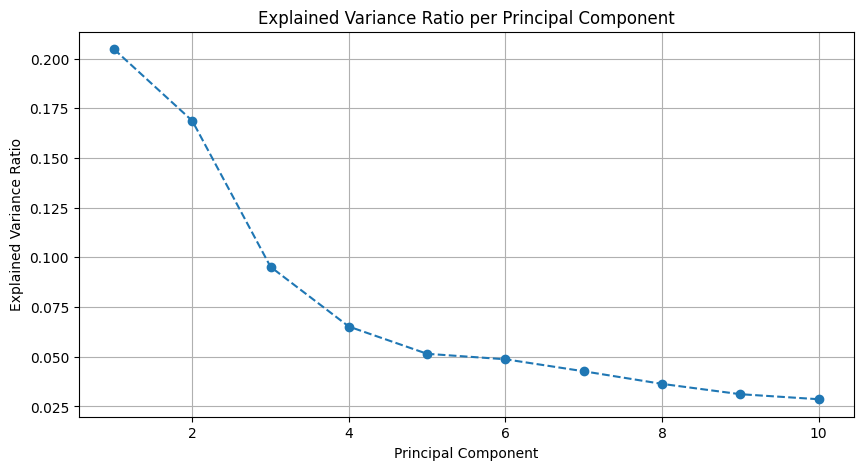

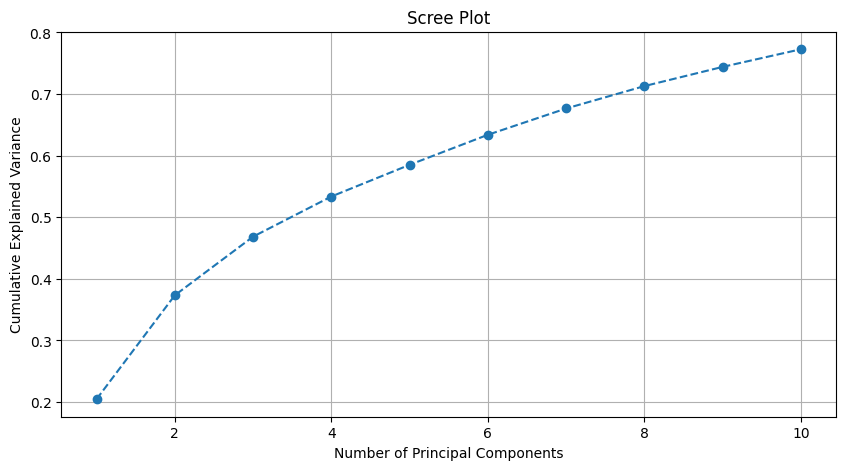

In [100]:

# Get explained variance ratios
explained_variance_ratios = pca.explained_variance_ratio_

# Calculate cumulative explained variance
cumulative_variance = np.cumsum(explained_variance_ratios)

# Plot explained variance ratios
plt.figure(figsize=(10, 5))
plt.plot(range(1, len(explained_variance_ratios) + 1), explained_variance_ratios, marker='o', linestyle='--')
plt.title('Explained Variance Ratio per Principal Component')
plt.xlabel('Principal Component')
plt.ylabel('Explained Variance Ratio')
plt.grid(True)
plt.show()

# Plot scree plot
plt.figure(figsize=(10, 5))
plt.plot(range(1, len(explained_variance_ratios) + 1), cumulative_variance, marker='o', linestyle='--')
plt.title('Scree Plot')
plt.xlabel('Number of Principal Components')
plt.ylabel('Cumulative Explained Variance')
plt.grid(True)
plt.show()